## Perguntas de Negócio

1. Crie uma nova coluna chamada: “dormitory_type”
    - Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’
    - Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’
    - Se o valor da coluna “bedrooms” for maior que 2 => ‘house’


2. Faça um gráfico de barras que represente a soma dos preços pelo número de quartos.


3. Faça um gráfico de linhas que represente a média dos preços pelo ano construção dos imóveis.


4. Faça um gráfico de barras que represente a média dos preços pelo tipo dos dormitórios.


5. Faça um gráfico de linha que mostre a evolução da média dos preços pelo ano da reforma dos 
imóveis, a partir do ano de 1930.


6. Faça um tabela que mostre a média dos preços por ano de construção e tipo de dormitórios dos 
imóveis.


7. Crie um Dashboard com os gráficos das questões 02, 03, 04 ( Dashboard: 1 Linha e 2 colunas )


8. Crie um Dashboard com os gráficos das perguntas 02, 04 ( Dashboard: 2 colunas )


9. Crie um Dashboard com os gráficos das perguntas 03, 05 ( Dashboard: 2 Linhas )


10. Faça um gráfico com o tamanho dos pontos sendo igual ao tamanho da sala de estar 



## Imports

In [3]:
import numpy  as np
import pandas as pd
import seaborn as sns
from IPython.core.display import HTML
from matplotlib import pyplot as plt
import plotly.express as px
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
sns.set(rc = {'figure.figsize':(10,6)})



In [4]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [10, 6]
    plt.rcParams['font.size'] = 24
    display(HTML('<style>. container {width:100% !important; }</style>'))
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option('display.expand_frame_repr', False)
    sns.set()

jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [113]:
# Supress Scientific Notation
np.set_printoptions(suppress=True)
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

## Loading data

In [5]:
# loading data into memory
df = pd.read_csv( 'csv/kc_house_data.csv' )

# Garantir que o formato date é um datetime 
df['date'] = pd.to_datetime( df['date'], format='%Y-%m-%d' )

In [6]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [7]:
df.dtypes

id                        int64
date             datetime64[ns]
price                   float64
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront                int64
view                      int64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
dtype: object

## 1. Crie uma nova coluna chamada: “dormitory_type”
    - Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’
    - Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’
    - Se o valor da coluna “bedrooms” for maior que 2 => ‘house’


In [8]:
df['dormitory_type'] = df['bedrooms'].apply(lambda linha: 'studio' if linha == 1 else 'apartment' if linha == 2  else 'house' if linha > 2 else 'NA')
df['dormitory_type'].unique()
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,dormitory_type
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,house
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,house
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,apartment
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,house
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,house


## 2. Faça um gráfico de barras que represente a soma dos preços pelo número de quartos.



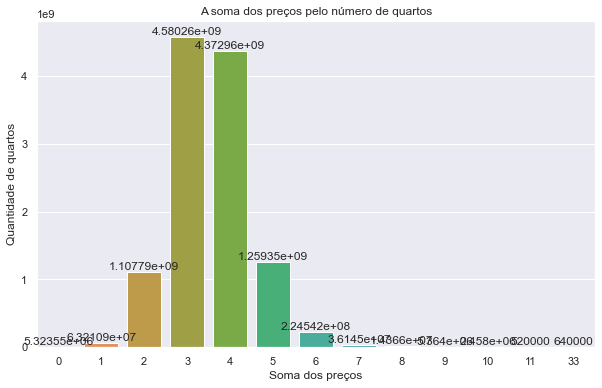

In [9]:
group2 = df.loc[:, ['bedrooms', 'price']].groupby('bedrooms').sum().sort_values('price').reset_index()
ax = sns.barplot(data=group2, x='bedrooms', y='price')
ax.bar_label(ax.containers[0])
ax.set(title='A soma dos preços pelo número de quartos', xlabel='Soma dos preços', ylabel='Quantidade de quartos');

## 3. Faça um gráfico de linhas que represente a média dos preços pelo ano construção dos imóveis.



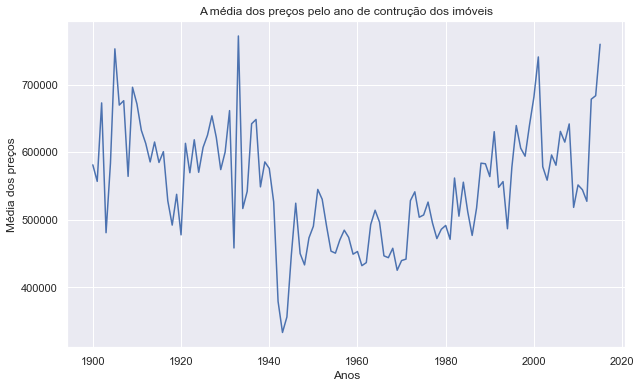

In [10]:
group3 = df.loc[:, ['yr_built', 'price']].groupby('yr_built').mean().sort_values('price').reset_index()
ax = sns.lineplot(data=group3, x='yr_built', y='price')
ax.set(title='A média dos preços pelo ano de contrução dos imóveis', xlabel='Anos', ylabel='Média dos preços');

## 4. Faça um gráfico de barras que represente a média dos preços pelo tipo dos dormitórios.


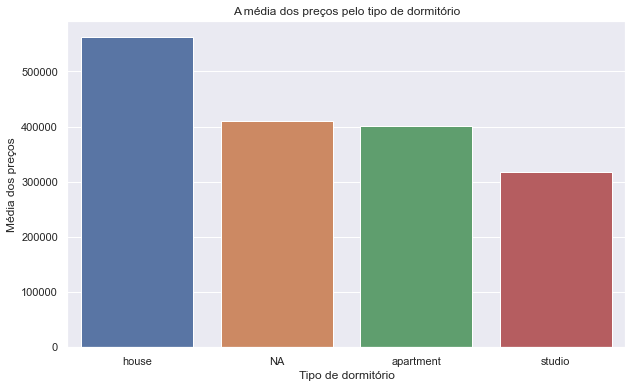

In [11]:
group4 = df.loc[:, ['dormitory_type', 'price']].groupby('dormitory_type').mean().sort_values('price', ascending=False).reset_index()
ax = sns.barplot(data=group4, x='dormitory_type', y='price')
ax.set(title='A média dos preços pelo tipo de dormitório', xlabel='Tipo de dormitório', ylabel='Média dos preços');

## 5. Faça um gráfico de linha que mostre a evolução da média dos preços pelo ano da reforma dos imóveis, a partir do ano de 1930.


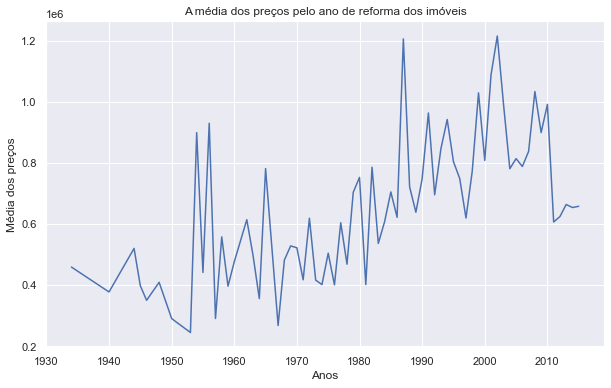

In [12]:
group5 = df[df['yr_renovated']>1930].loc[:, ['yr_renovated', 'price']].groupby('yr_renovated').mean().sort_values('price').reset_index()
ax = sns.lineplot(data=group5, x='yr_renovated', y='price')
ax.set(title='A média dos preços pelo ano de reforma dos imóveis', xlabel='Anos', ylabel='Média dos preços');

## 6. Faça um tabela que mostre a média dos preços por ano de construção e tipo de dormitórios dos imóveis.

In [13]:
ax = df.loc[:, ['price', 'yr_built', 'dormitory_type']].groupby(['yr_built', 'dormitory_type']).mean().sort_values('yr_built')
ax.head()

price
yr_built dormitory_type               
1900     apartment       589533.333333
         house           584854.271429
         studio          398944.000000
1901     apartment       452856.400000
         house           578619.166667

## 7. Crie um Dashboard com os gráficos das questões 02, 03, 04 ( Dashboard: 1 Linha e 2 colunas )


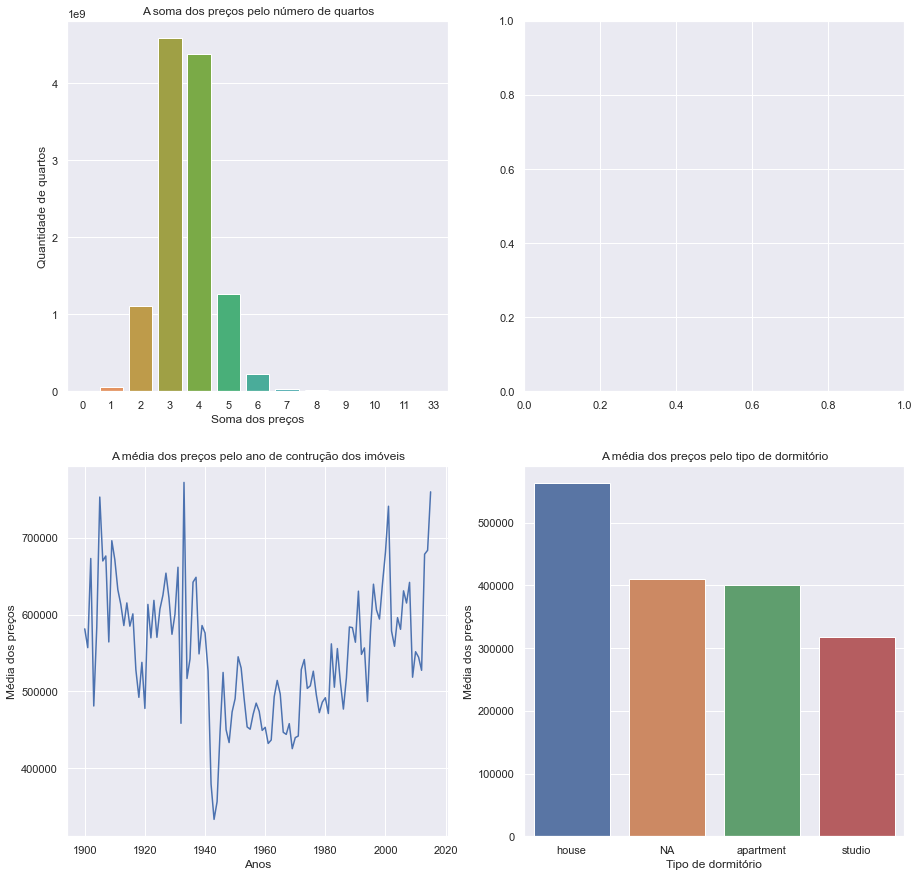

In [14]:
f, axes = plt.subplots(2 , 2, figsize=(15, 15))
fig1 = sns.barplot(data= group2, x='bedrooms', y='price', ax = axes[0, 0])
fig1.set(title='A soma dos preços pelo número de quartos', xlabel='Soma dos preços', ylabel='Quantidade de quartos');
#fig2 = sns.barplot(data= group2, x='bedrooms', y='price', ax = axes[0,1])
#fig2.set(title='A soma dos preços pelo número de quartos', xlabel='Soma dos preços', ylabel='Quantidade de quartos');

fig2 = sns.lineplot(data= group3, x='yr_built', y='price', ax = axes[1,0])
fig2.set(title='A média dos preços pelo ano de contrução dos imóveis', xlabel='Anos', ylabel='Média dos preços');

fig3 = sns.barplot(data=group4, x='dormitory_type', y='price', ax = axes[1,1])
fig3.set(title='A média dos preços pelo tipo de dormitório', xlabel='Tipo de dormitório', ylabel='Média dos preços');

plt.show()

## 8. Crie um Dashboard com os gráficos das perguntas 02, 04 ( Dashboard: 2 colunas )

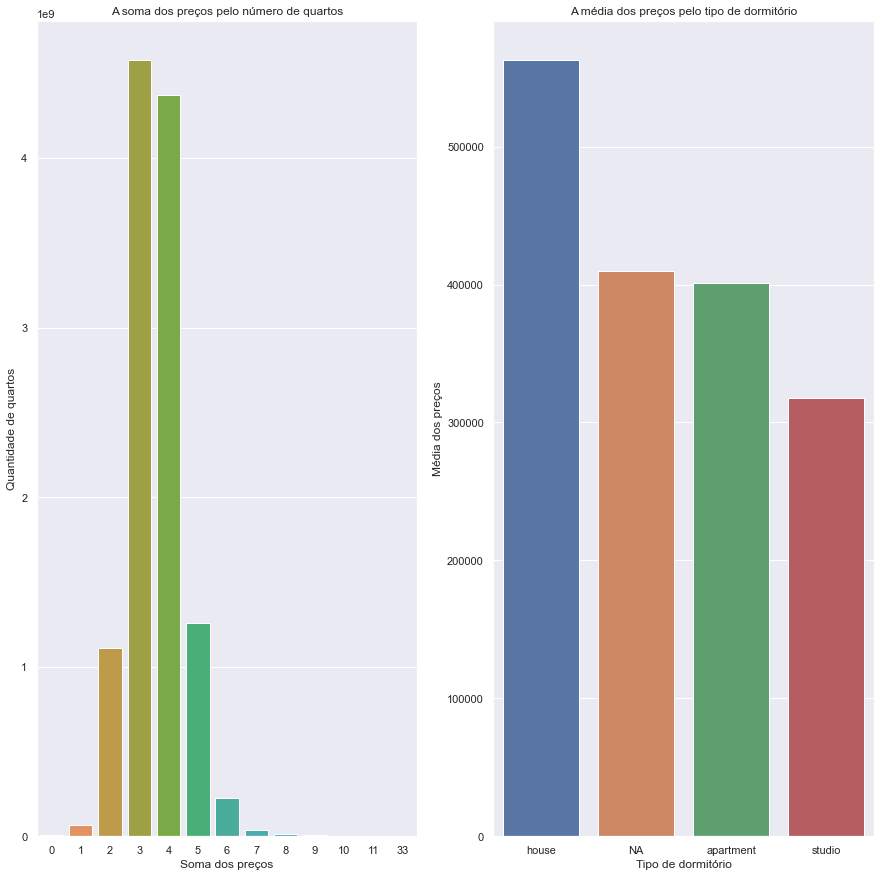

In [15]:
f, axes = plt.subplots(1 , 2, figsize=(15, 15))

fig1 = sns.barplot(data= group2, x='bedrooms', y='price', ax = axes[0])
fig1.set(title='A soma dos preços pelo número de quartos', xlabel='Soma dos preços', ylabel='Quantidade de quartos');

fig2 = sns.barplot(data=group4, x='dormitory_type', y='price', ax = axes[1])
fig2.set(title='A média dos preços pelo tipo de dormitório', xlabel='Tipo de dormitório', ylabel='Média dos preços');

## 9. Crie um Dashboard com os gráficos das perguntas 03, 05 ( Dashboard: 2 Linhas )

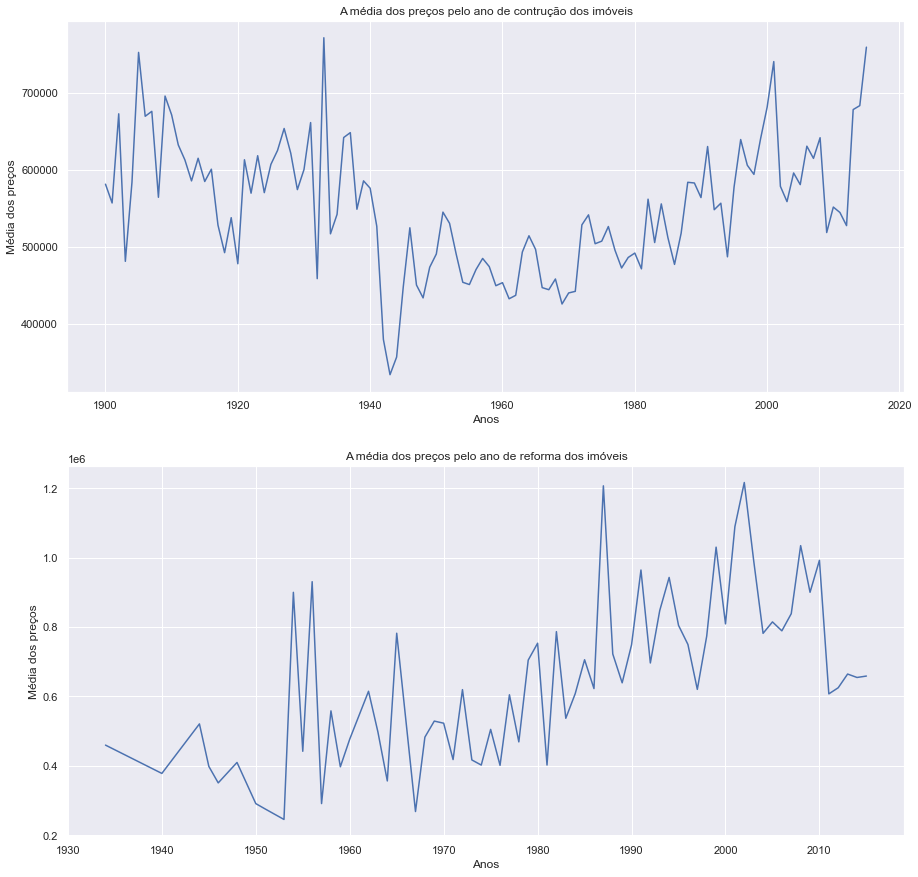

In [16]:
f, axes = plt.subplots(2 , 1, figsize=(15, 15))

fig1 = sns.lineplot(data= group3, x='yr_built', y='price', ax = axes[0])
fig1.set(title='A média dos preços pelo ano de contrução dos imóveis', xlabel='Anos', ylabel='Média dos preços');
fig2 = sns.lineplot(data=group5, x='yr_renovated', y='price', ax = axes[1])
fig2.set(title='A média dos preços pelo ano de reforma dos imóveis', xlabel='Anos', ylabel='Média dos preços');

## 10. Faça um gráfico com o tamanho dos pontos sendo igual ao tamanho da sala de estar 

In [17]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,dormitory_type
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,house
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,house
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,apartment
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,house
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,house


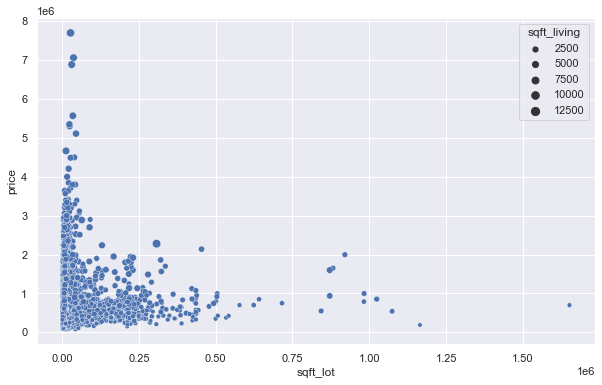

In [18]:

ax = sns.scatterplot(data=df, x='sqft_lot', y='price', size='sqft_living'); 

In [19]:
houses = df[['id', 'long', 'lat', 'sqft_living']].copy()

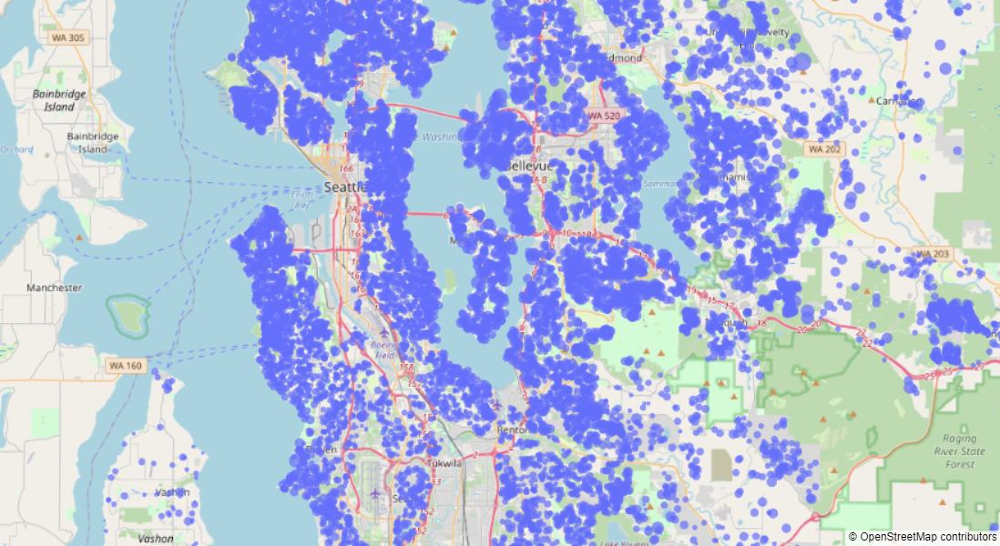

In [20]:
fig = px.scatter_mapbox(houses,
                  lat = 'lat',
                  lon = 'long',
                  size = 'sqft_living',
                  color_continuous_scale=px.colors.cyclical.IceFire, 
                  size_max = 15,
                  zoom = 10)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(height=600, margin={'r':0, 'l':0, 't':0, 'b':0})
fig.show()

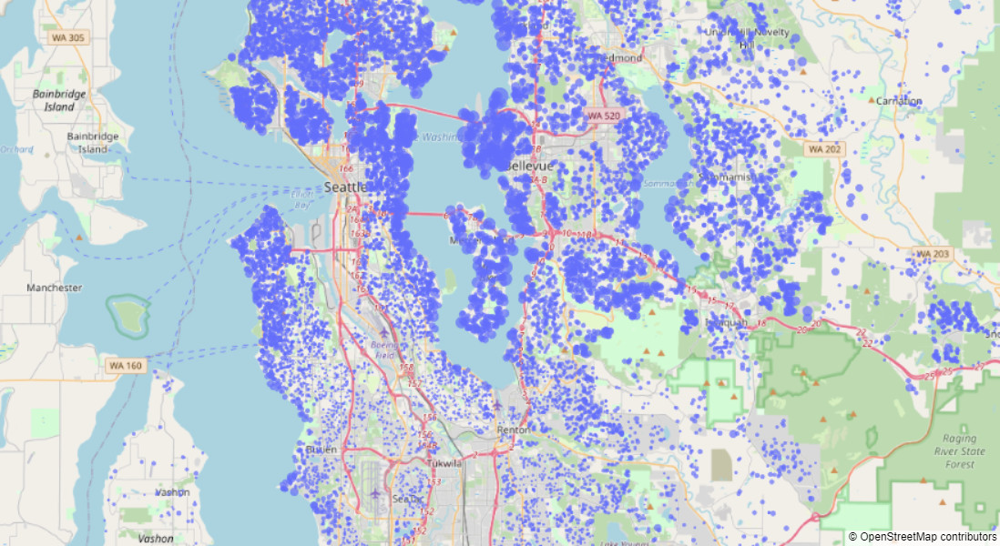

In [21]:
fig = px.scatter_mapbox(df[['id', 'long', 'lat', 'price']],
                  lat = 'lat',
                  lon = 'long',
                  size = 'price',
                  color_continuous_scale=px.colors.cyclical.IceFire, 
                  size_max = 15,
                  zoom = 10)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(height=600, margin={'r':0, 'l':0, 't':0, 'b':0})
fig.show()